<img width="400" src="https://nomeroff.net.ua/images/logo/nomeroff_net.svg" alt="Nomeroff Net. Automatic numberplate recognition system" align="left"/>

## The example demonstrates license plate number detection.

Before runing this demo, please download models from [https://nomeroff.net.ua/models/](https://nomeroff.net.ua/models/) to **./models/** directory. 

In [1]:
#Specify device
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0" 
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
# os.environ["CUDA_VISIBLE_DEVICES"] = ""  # For CPU inference

In [2]:
# Import all necessary libraries.
import numpy as np
import sys
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
import copy

# NomeroffNet path
NOMEROFF_NET_DIR = os.path.abspath('../')
sys.path.append(NOMEROFF_NET_DIR)

In [3]:
from NomeroffNet.YoloV5Detector import Detector

detector = Detector()
detector.load()

/usr/local/lib64/python3.8/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


Fusing layers... 


In [4]:
from NomeroffNet.BBoxNpPoints import NpPointsCraft, getCvZoneRGB, convertCvZonesRGBtoBGR, reshapePoints

npPointsCraft = NpPointsCraft()
npPointsCraft.load()

Loading weights from checkpoint (/mnt/data/var/www/nomeroff-net/NomeroffNet/Base/mcm/./models/NpPointsCraft/mtl/craft_mlt_25k_2020-02-16.pth)
Loading weights of refiner from checkpoint (/mnt/data/var/www/nomeroff-net/NomeroffNet/Base/mcm/./models/NpPointsCraft/refiner/craft_refiner_CTW1500_2020-02-16.pth )


In [5]:
from NomeroffNet.OptionsDetector import OptionsDetector
from NomeroffNet.TextDetector import TextDetector

optionsDetector = OptionsDetector()
optionsDetector.load("latest")

# Initialize text detector.
textDetector = TextDetector({
    "eu_ua_2004_2015": {
        "for_regions": ["eu_ua_2015", "eu_ua_2004"],
        "model_path": "latest"
    },
    "eu_ua_1995": {
        "for_regions": ["eu_ua_1995"],
        "model_path": "latest"
    },
    "eu": {
        "for_regions": ["eu"],
        "model_path": "latest"
    },
    "ru": {
        "for_regions": ["ru", "eu-ua-fake-lnr", "eu-ua-fake-dnr"],
        "model_path": "latest" 
    },
    "kz": {
        "for_regions": ["kz"],
        "model_path": "latest"
    },
    "ge": {
        "for_regions": ["ge"],
        "model_path": "latest"
    },
    "su": {
        "for_regions": ["su"],
        "model_path": "latest"
    }
})

In [6]:
%matplotlib inline
plt.rcParams["figure.figsize"] = (20,10)

[[[874.3235626407978, 570.6531732587126], [874.3235626407978, 512.2357525013776], [1081.676445900226, 465.01678273360517], [1081.6764373592023, 523.4342024399426]]]


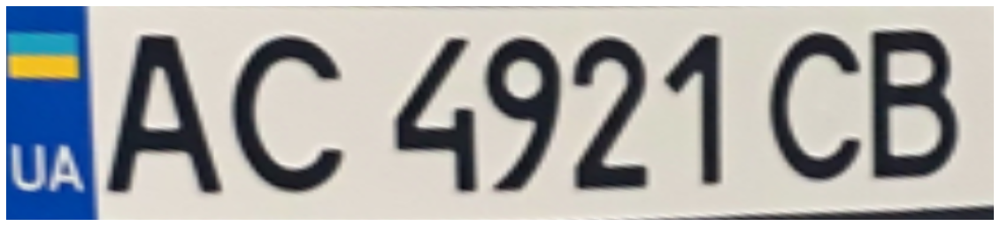

['eu_ua_2015']
[1]
['AC4921CB']


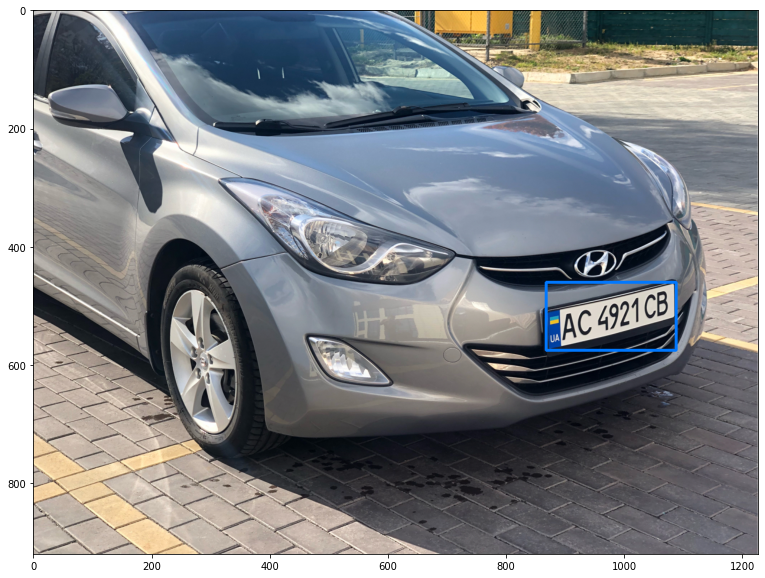

[[[108.29973057393354, 461.8413293169097], [108.29973057393356, 430.528198066833], [274.5352166716764, 482.58173187598334], [274.5351978334593, 513.8948596099843]]]


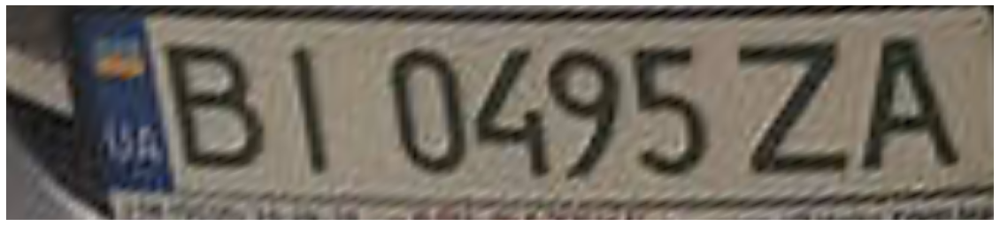

['eu_ua_2015']
[1]
['BI0495ZA']


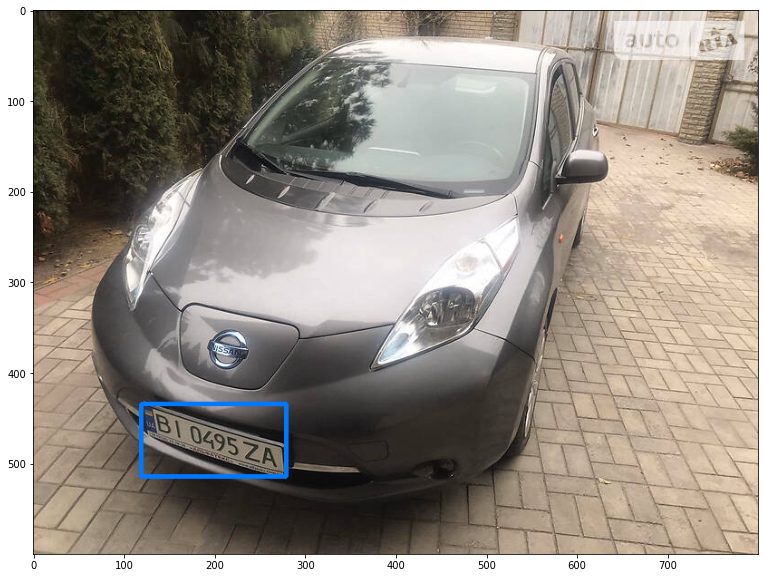

[[[1697.5965694469178, 1052.3518418866518], [1697.5965694469176, 997.7636108476563], [1787.6061931584939, 923.6380438141591], [1787.6061865406627, 978.2262743444318]]]


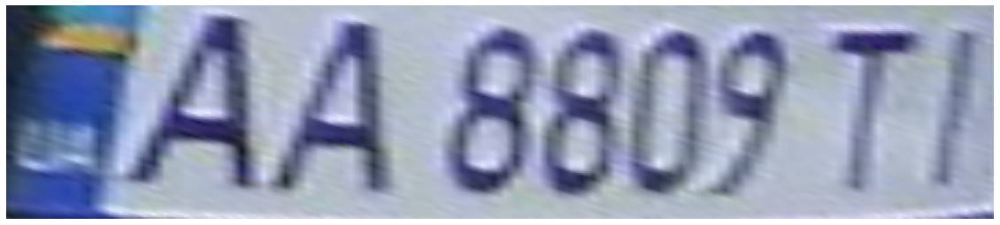

['eu_ua_2015']
[1]
['AA8809TI']


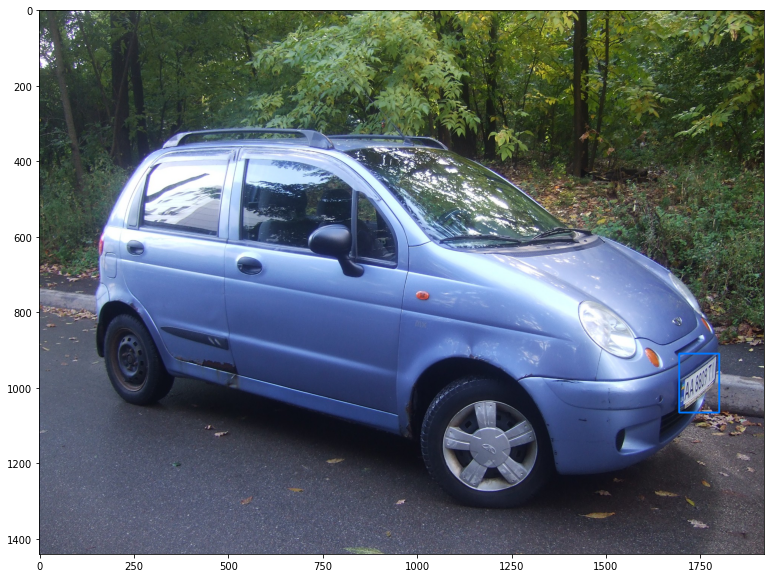

[[[436.6574007048765, 615.5625542715375], [436.6574007048766, 568.8500651815474], [664.3425992951235, 575.2637351308608], [664.342606391556, 621.9762253645091]]]


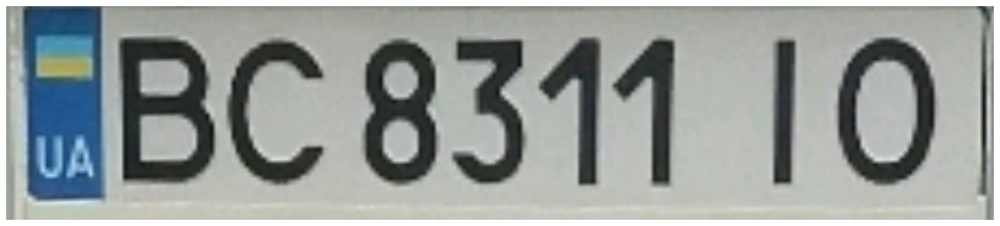

['eu_ua_2015']
[1]
['BC8311IO']


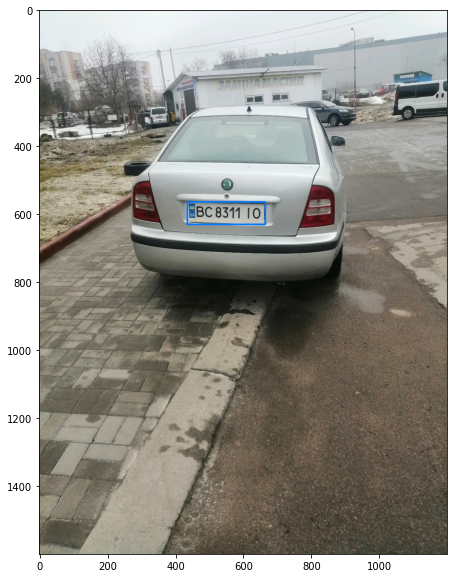

[[[413.6612299398114, 976.0865229574092], [375.0, 861.0693706155964], [600.4925225398048, 785.2735728027606], [639.1537482353835, 900.290722558265]]]


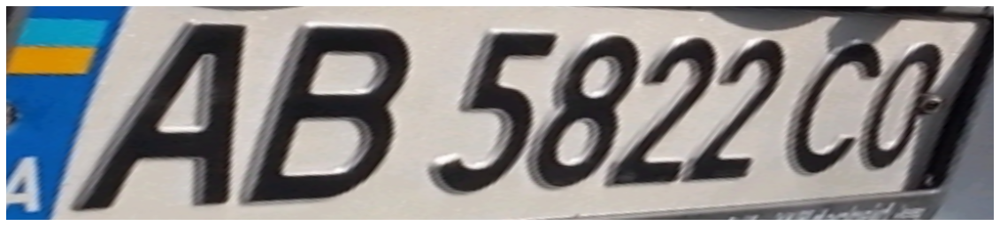

['eu_ua_2015']
[1]
['AB5822CI']


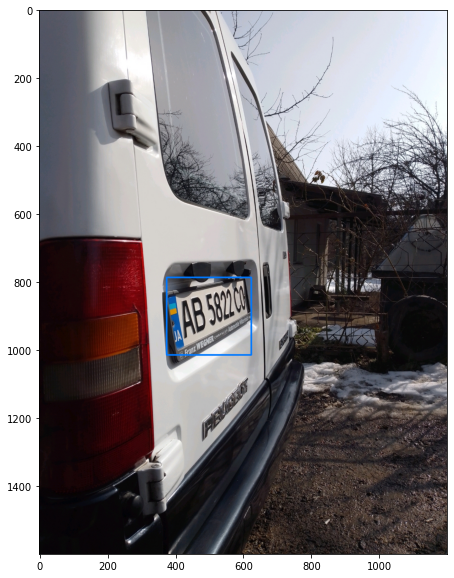

[[[845.0, 405.4], [845.0, 380.6], [946.0, 380.6], [946.0, 405.4]], [[429.0, 402.9066669154166], [429.00000118255616, 379.7599954225122], [526.0, 379.75999135728915], [526.0, 402.9066625791787]]]


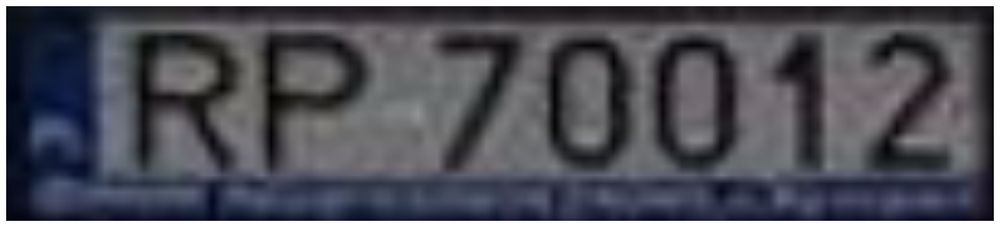

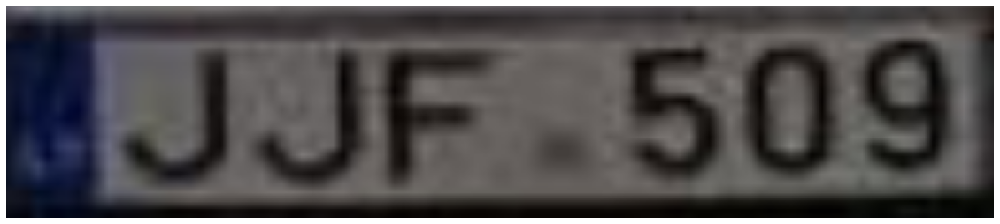

['eu', 'eu']
[1, 1]
['RP70012', 'JJF509']


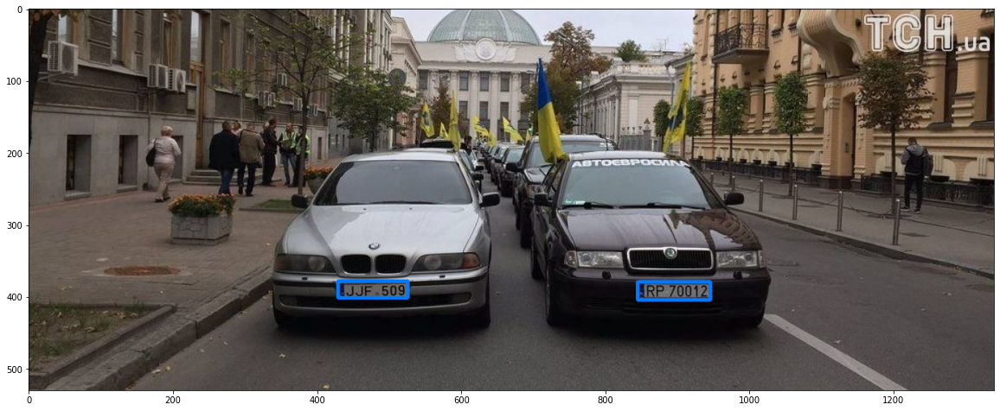

[[[247.16761444583878, 936.1226476567235], [247.16761444583878, 874.2821748371579], [548.8323855541612, 960.4721477750429], [548.8323898169715, 1022.312618492156]]]


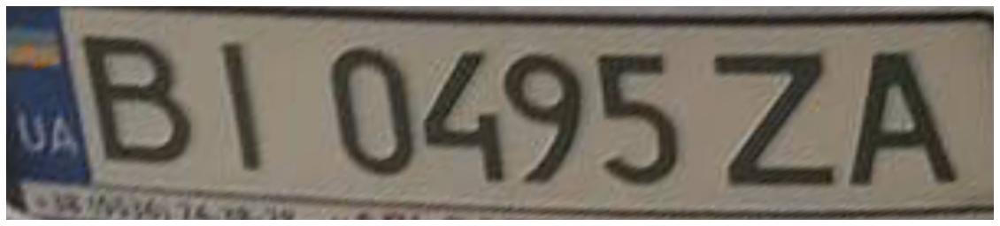

['eu_ua_2015']
[1]
['BI0495ZA']


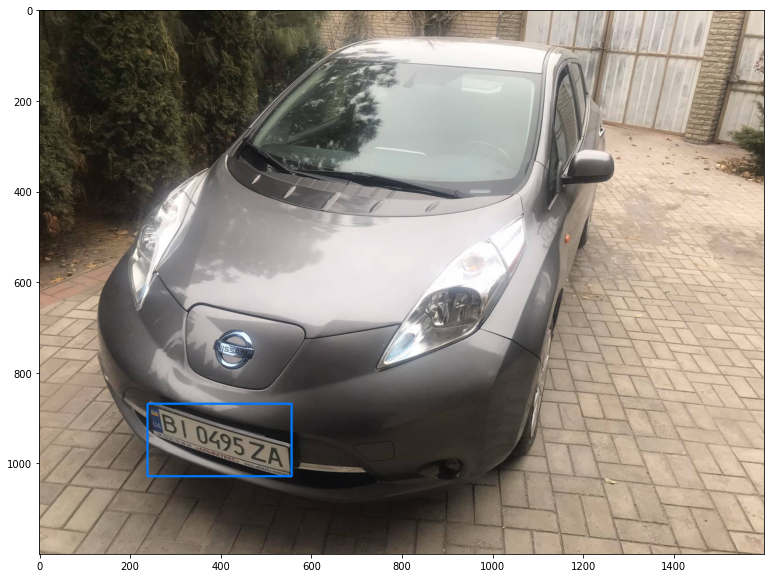

[[[543.0, 954.4554254513076], [548.8159010317047, 886.1187266878469], [928.0, 918.3897483572066], [922.184094257369, 986.7264516241363]]]


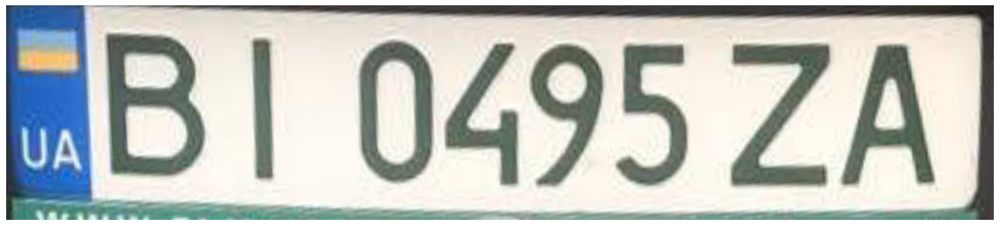

['eu_ua_2015']
[1]
['BI0495ZA']


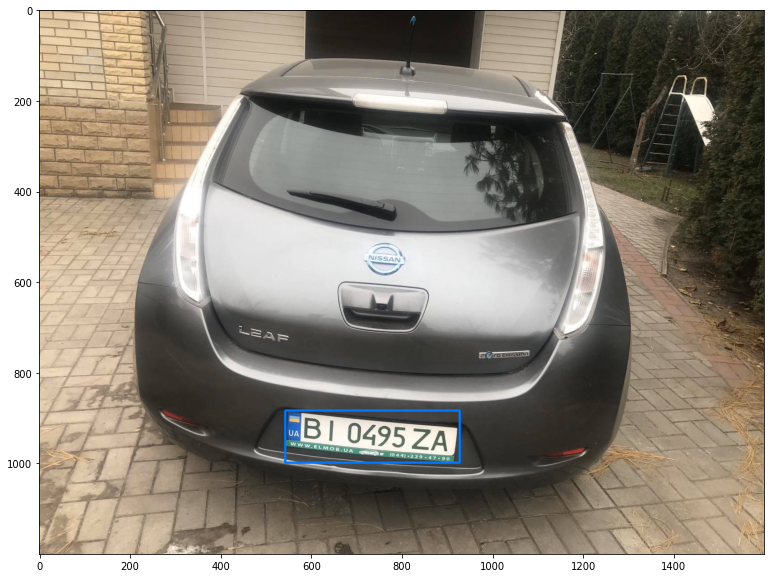

[[[392.0, 926.2504203545336], [393.53315093618596, 865.4352885531214], [721.0, 873.6907569825718], [719.466877448966, 934.5058921807407]]]


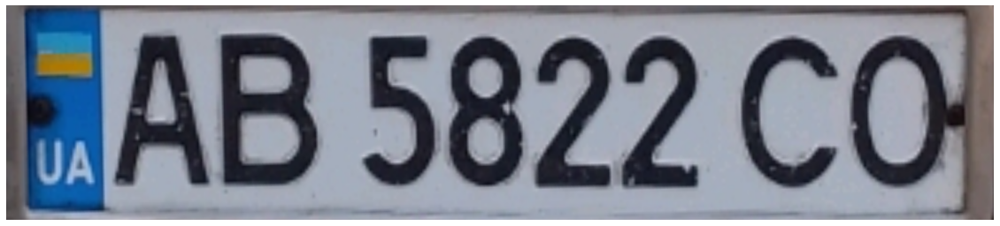

['eu_ua_2015']
[1]
['AB5822CO']


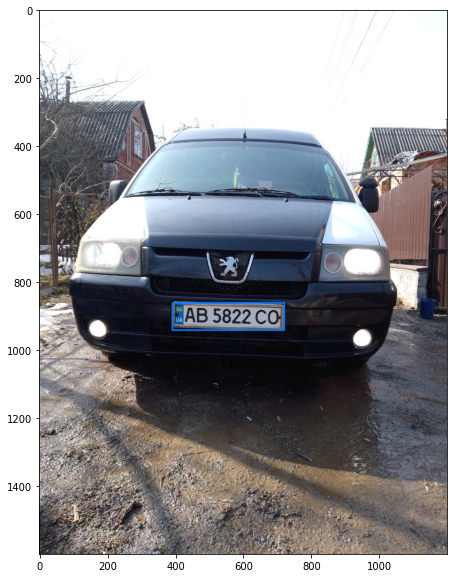

[[[191.0, 451.9066694762491], [191.00000213623048, 410.0933297209307], [278.0, 410.0933261852909], [278.0, 451.9066638192254]]]


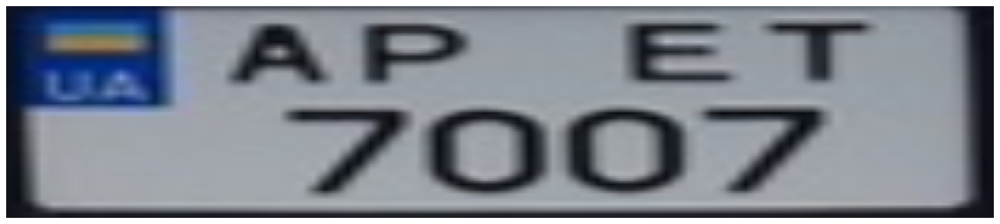

['eu_ua_2015']
[2]
['AEE7POT']


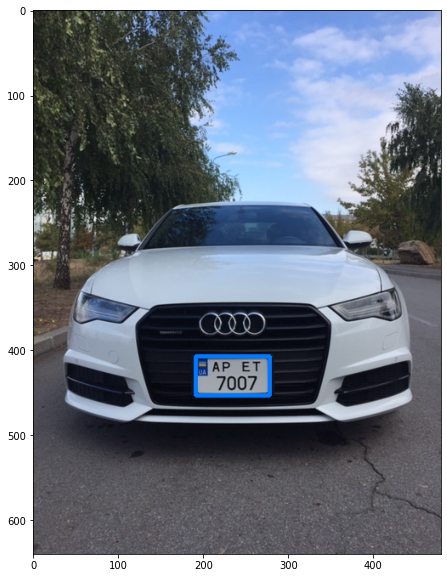

[[[342.9571204285086, 711.1845402503262], [342.9571204285086, 653.2046284874596], [586.8106450408217, 663.2260057403913], [586.8106196135541, 721.205915785642]]]


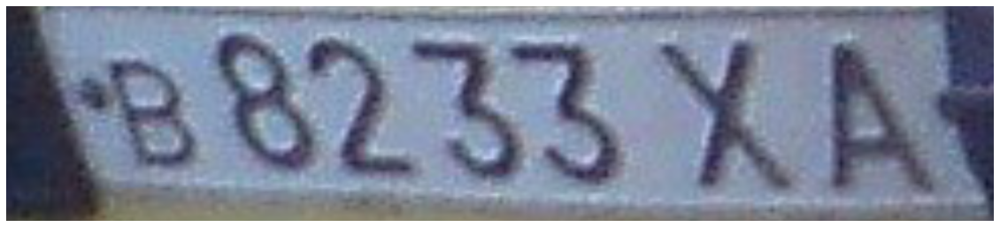

['su']
[1]
['В8233ХА']


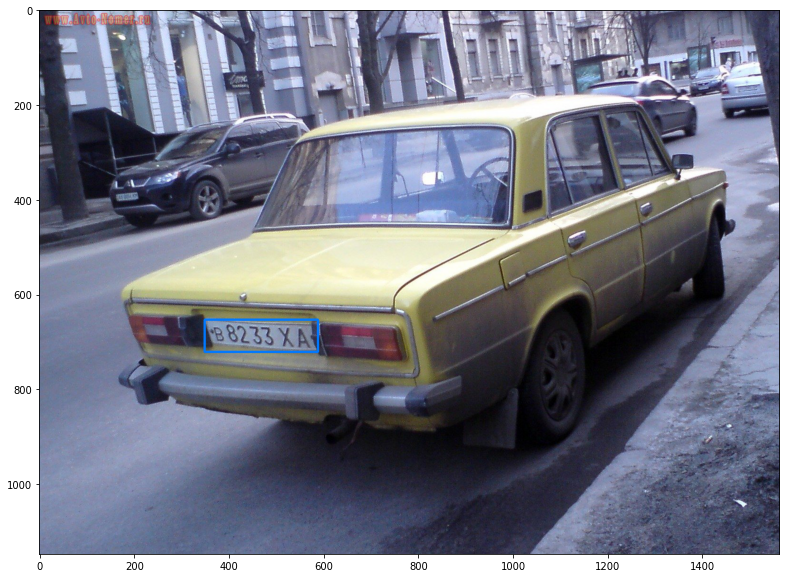

[[[283.99156253389936, 700.2467921255609], [283.99156253389936, 610.9401864775319], [409.8903819278971, 625.7518311065483], [409.8903797957352, 715.0584372540519]]]


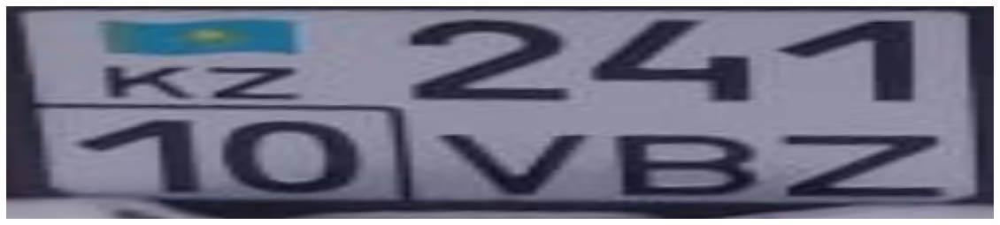

['kz']
[2]
['24110VB2']


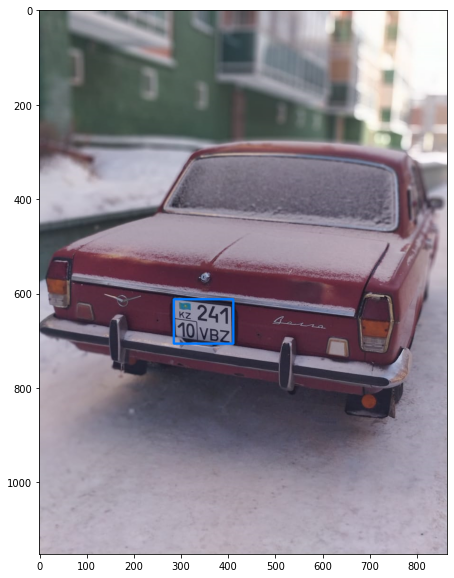

[[[1725.0261586346603, 1804.0322932238535], [1725.0261586346603, 1638.3331928519042], [2596.0828125796124, 1554.3198510143127], [2596.0828173056398, 1720.0189513427363]]]


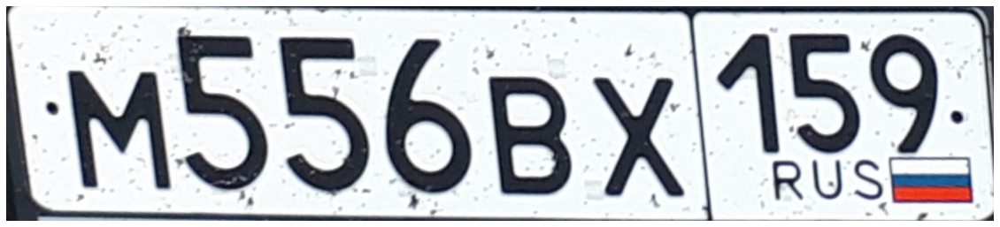

['ru']
[1]
['M556BX159']


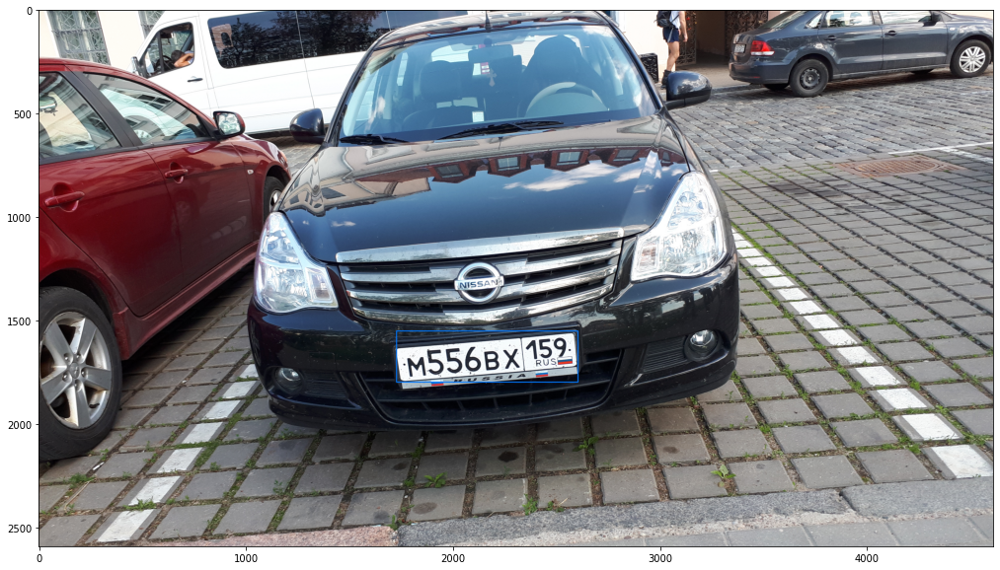

[[[272.0, 477.288205460122], [275.48962031618066, 440.9960556649157], [464.0, 459.1220535427602], [460.51038086148185, 495.414202797582]]]


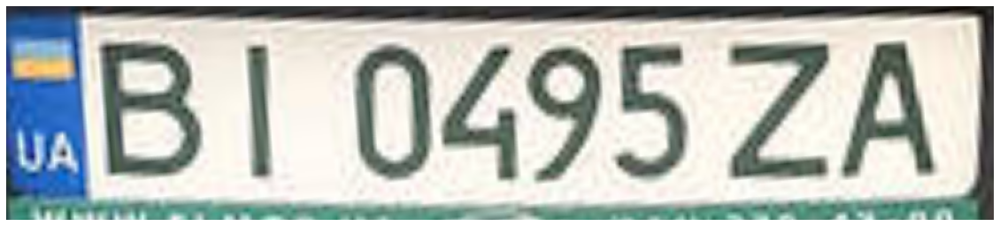

['eu_ua_2015']
[1]
['BI0495ZA']


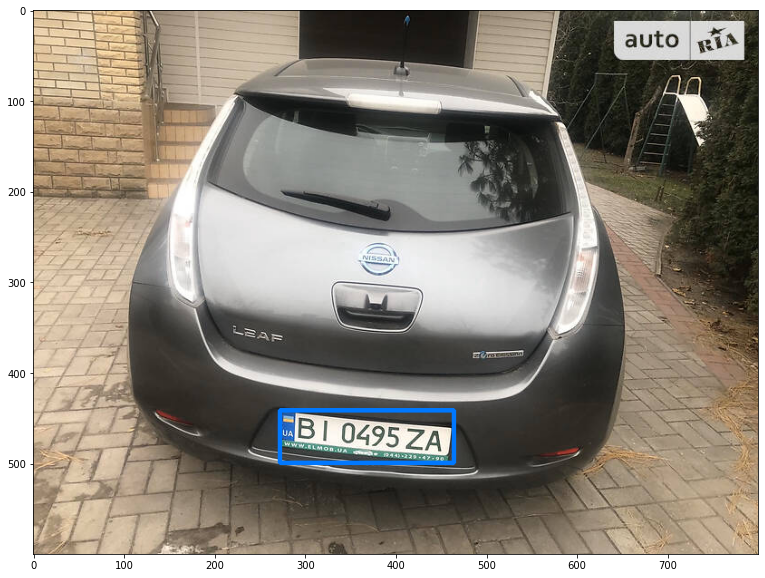

[[[166.3530909009117, 446.94789647781045], [166.35309090091167, 387.5464002443402], [304.6319841217266, 458.22227079284096], [304.6319779268838, 517.6237751528337]]]


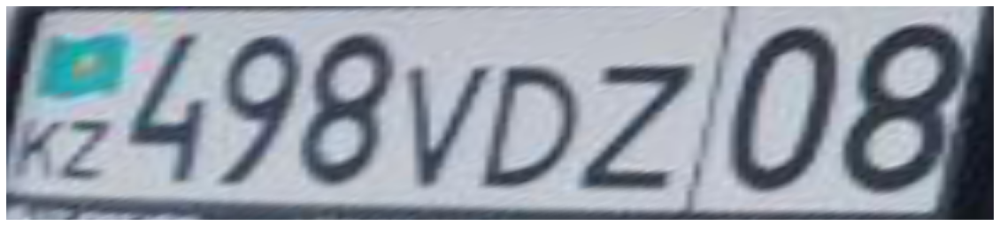

['kz']
[1]
['498VDZ08']


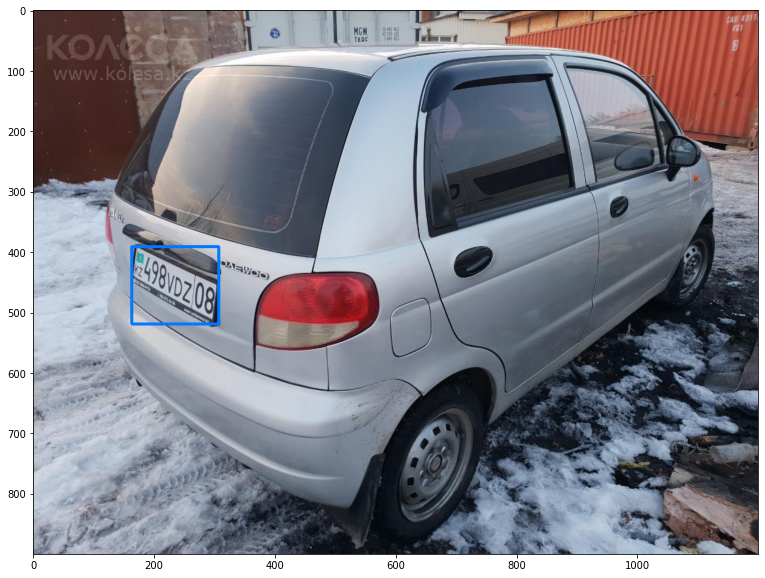

[[[641.0, 496.19999992370606], [641.0, 463.133333568573], [799.0, 463.133333568573], [799.0, 496.19999992370606]]]


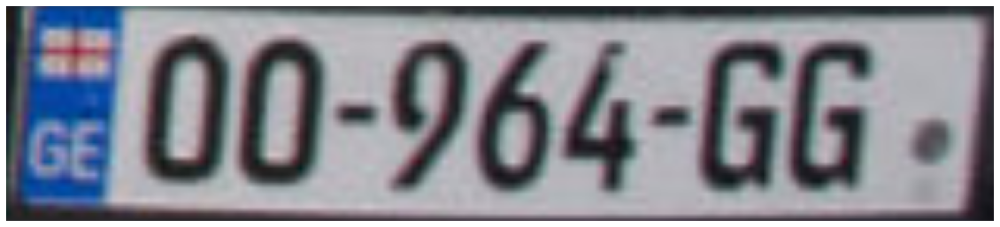

['ge']
[1]
['00964GG']


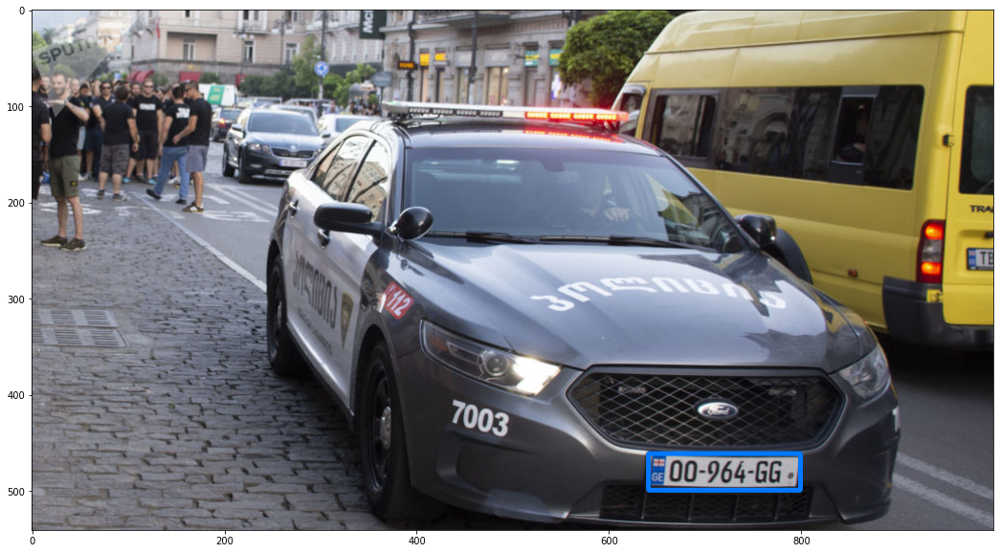

In [7]:
rootDir = 'images/*'

imgs = [mpimg.imread(img_path) for img_path in glob.glob(rootDir)]

for img in imgs:
    targetBoxes = detector.detect_bbox(copy.deepcopy(img))
    targetBoxes = targetBoxes

    all_points = npPointsCraft.detect(img, targetBoxes)
    all_points = [ps for ps in all_points if len(ps)]
    print(all_points)

     # cut zones
    toShowZones = [getCvZoneRGB(img, reshapePoints(rect, 1)) for rect in all_points]
    zones = convertCvZonesRGBtoBGR(toShowZones)
    for zone, points in zip(toShowZones, all_points):
        plt.axis("off")
        plt.imshow(zone)
        plt.show()

    # find standart
    regionIds, stateIds, countLines = optionsDetector.predict(zones)
    regionNames = optionsDetector.getRegionLabels(regionIds)
    print(regionNames)
    print(countLines)

    # find text with postprocessing by standart  
    textArr = textDetector.predict(zones, regionNames, countLines)
    print(textArr)
    
    # draw rect and 4 points
    for targetBox, points in zip(targetBoxes, all_points):
        cv2.rectangle(img, 
                      (int(targetBox[0]), int(targetBox[1])), 
                      (int(targetBox[2]), int(targetBox[3])), 
                      (0,120,255), 
                      3)
    plt.imshow(img)
    plt.show()